# Exploring ABC Radio National metadata

This notebook shows a few ways you can start to explore the ABC Radio National metadata harvested [using this notebook](harvest-abcrn.ipynb).

For an earlier experiment playing with this data, see [In a word...: Currents in Australian affairs, 2003–2013](https://inaword.herokuapp.com/).

In [74]:
import pandas as pd
from pathlib import Path
import re
import altair as alt
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /Users/tim/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

Load the harvested data.

In [15]:
df = pd.read_csv(Path('data', 'abcrn-2021-01-15.csv'))

How many records are there?

In [4]:
df.shape[0]

408082

In [91]:
df.columns

Index(['work_id', 'version_id', 'title', 'isPartOf', 'date', 'creator',
       'contributor', 'publisher', 'rights', 'type', 'format', 'abstract',
       'subject', 'description', 'fulltext_url', 'thumbnail_url',
       'notonline_url', 'year'],
      dtype='object')

## Programs

How many programs are there records for?

In [7]:
programs = list(df['isPartOf'].unique())
len(programs)

164

In [9]:
sorted(programs)

['',
 'ABC News',
 'ABC News. ',
 'ABC News|ABC Radio National. Bush Telegraph',
 'ABC Radio',
 'ABC Radio National. ',
 'ABC Radio National.  Big Ideas',
 'ABC Radio National. 360documentaries',
 'ABC Radio National. A Big Country',
 'ABC Radio National. A Short History of Video Games',
 'ABC Radio National. ADD SHOW NAME',
 'ABC Radio National. AWAYE!',
 'ABC Radio National. Airplay',
 'ABC Radio National. All In The Mind',
 'ABC Radio National. All in the Mind',
 'ABC Radio National. Animal People',
 'ABC Radio National. Artworks',
 'ABC Radio National. Australia Talks',
 'ABC Radio National. Background Briefing',
 'ABC Radio National. Best Practice',
 'ABC Radio National. Best of the Festivals',
 'ABC Radio National. Between The Lines',
 'ABC Radio National. Big Ideas',
 'ABC Radio National. Blueprint',
 'ABC Radio National. Blueprint for Living',
 'ABC Radio National. Book Talk',
 'ABC Radio National. Books +',
 'ABC Radio National. Books and Arts',
 'ABC Radio National. Books and

Which programs have the most records?

In [11]:
df['isPartOf'].value_counts()[:25]

ABC Radio National. RN Breakfast            59036
ABC Radio. AM                               55538
ABC Radio. The World Today                  51253
ABC Radio. PM                               50853
ABC Radio. RN Breakfast                     19877
ABC Radio. RN Drive                         12759
ABC Radio National. RN Drive                11850
ABC Radio National. Life Matters            10657
ABC Radio National. Late Night Live          9904
ABC Radio. AM Archive                        9825
ABC Radio. PM Archive                        8430
ABC Radio. The World Today Archive           7902
ABC Radio National. The Science Show         6182
ABC Radio National. Saturday Extra           5218
ABC Radio                                    4612
ABC Radio National. Counterpoint             4049
ABC Radio. Correspondents Report             3924
ABC Radio National. Health Report            3557
ABC Radio National. Sunday Extra             3451
ABC Radio National. AWAYE!                   3311


## Number of records by year

To look at the number of records by year, we need to make sure the `date` field is being recognised as a `datetime`. Then we can extract the year into a new column.

In [26]:
df['date'] = pd.to_datetime(df['date'], errors='coerce')
df['year'] = df['date'].dt.year.astype('Int64')

Find the number of times each year appears.

In [30]:
year_counts = df['year'].value_counts().to_frame().reset_index()
year_counts.columns = ['year', 'count']

Chart the results.

In [35]:
alt.Chart(year_counts).mark_bar().encode(
    x='year:O',
    y='count:Q',
    tooltip=['year', alt.Tooltip('count:Q', format=',')]
)

alt.Chart(...)

The early records look a bit suspect, and I should probably check them manually. I'm also wondering why there's been such a large decline in the number of records added since 2017. 

## People

The `contributor` field includes the names of hosts, reporters, and guests. It's stored as a pipe-delimited string, so we have to split the string, then explode the resulting list to create one row per name.

In [44]:
people = df['contributor'].str.split('|').explode().dropna()

Then we can calculate how often people appear in the records.

In [72]:
people.value_counts()[:25]

Fran Kelly            56725
Mark Colvin           31871
Eleanor Hall          27027
Robyn Williams        13576
Patricia Karvelas     13087
Phillip Adams         12704
Natasha Mitchell      10681
Tony Eastley          10102
Elizabeth Jackson      7680
Geraldine Doogue       7145
Richard Aedy           7087
Linda Mottram          6342
Peter Cave             5421
Alexandra Kirk         4797
Brendan Trembath       4496
Michael Cathcart       4456
Kim Landers            4428
Michael Brissenden     4236
David Fisher           4230
Dr Norman Swan         4150
Peter Ryan             3999
Sabra Lane             3935
Jonathan Green         3722
Paul Barclay           3695
Ashley Hall            3585
Name: contributor, dtype: int64

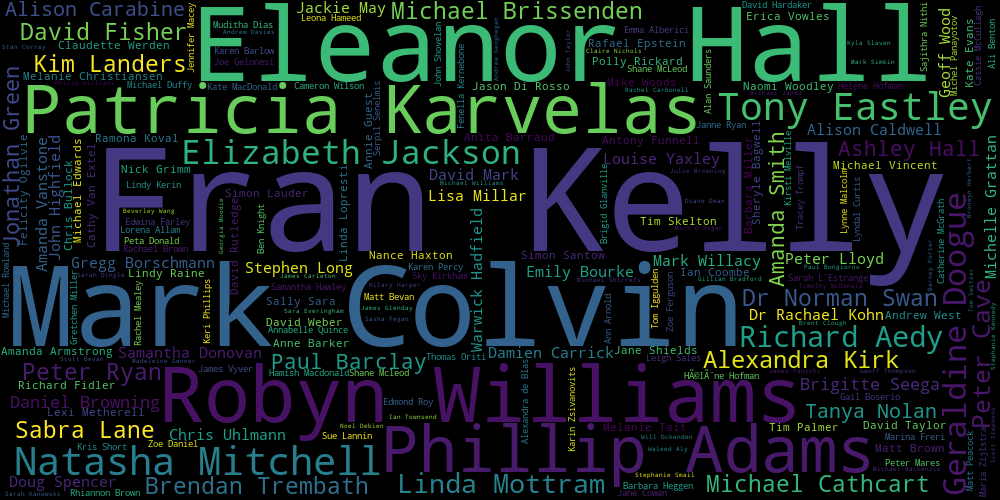

In [53]:
wc_people = WordCloud(width=1000, height=500).fit_words(people.value_counts().to_dict())
wc_people.to_image()

## Titles

There are three text fields that could yield some interesting analysis. The `title` field is obvious enough, though some regular segments do have duplicate titles. The `abstract` field is a brief summary of the segment or program. The `description` field seems to be the beginning of the transcript, but often seems to be much the same as the `abstract`.

Let's try aggregating the titles for a program.

### RN Breakfast in 2020

In [59]:
breakfast_titles = list(df.loc[(df['isPartOf'].isin(['ABC Radio National. RN Breakfast', 'ABC Radio. RN Breakfast'])) & (df['year'] == 2020)].drop_duplicates(subset=['title'], keep=False)['title'].unique())

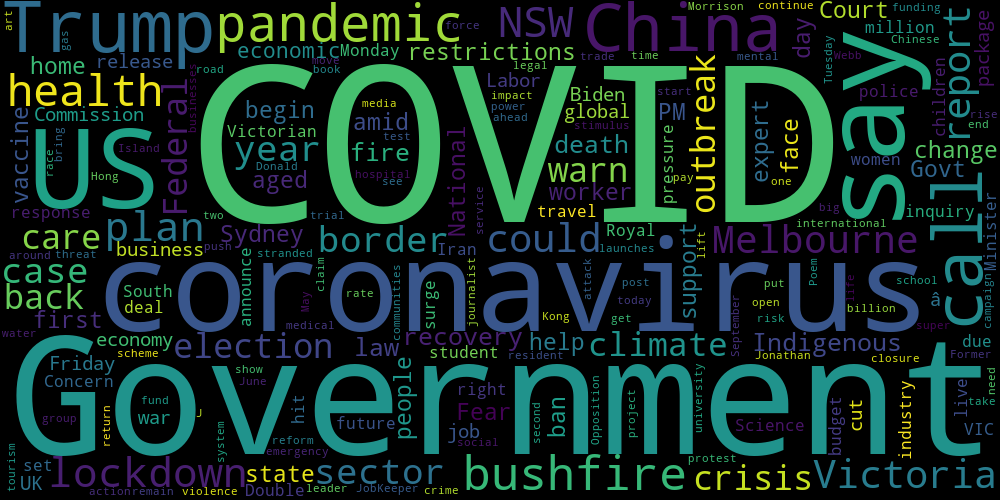

In [60]:
wordcloud = WordCloud(width=1000, height=500, stopwords=stopwords.words('english') + ['Australia', 'Australian', 'Australians', 'New', 'News', 'Matt', 'Bevan', 'World'], collocations=False).generate(' '.join(breakfast_titles))
wordcloud.to_image()

## RN Drive in 2020

In [61]:
drive_titles = list(df.loc[(df['isPartOf'].isin(['ABC Radio National. RN Drive', 'ABC Radio. RN Drive'])) & (df['year'] == 2020)].drop_duplicates(subset=['title'], keep=False)['title'].unique())

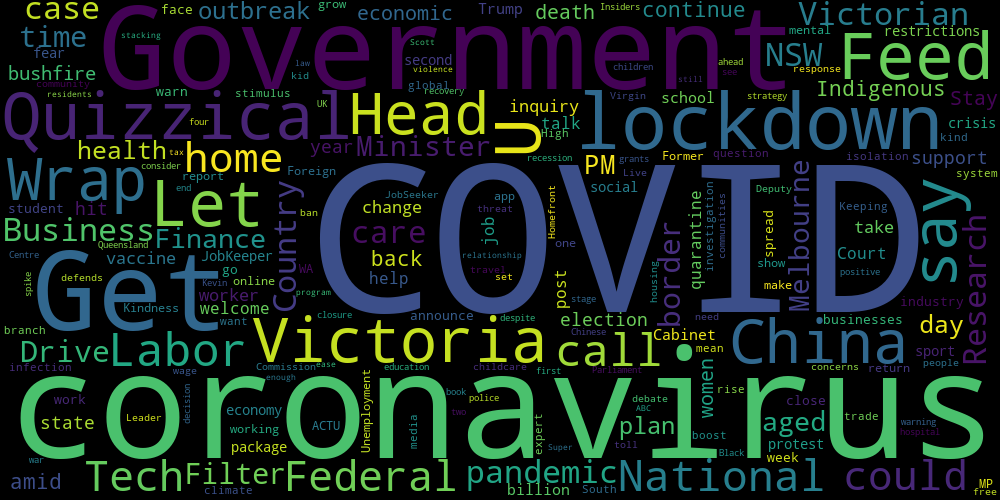

In [62]:
wordcloud = WordCloud(width=1000, height=500, stopwords=stopwords.words('english') + ['Australia', 'Australian', 'Australians', 'New', 'News', 'Matt', 'Bevan', 'World'], collocations=False).generate(' '.join(drive_titles))
wordcloud.to_image()

## Title words over time

We can also look to see how often particular words or phrases appeared in the titles of RN segments or programs. This could of course be filtered by program, as above.

### Bushfires

In [84]:
# Drop records without a title
df_titles = df.dropna(subset=['title'])
# Find titles containing 'bushfire'
bushfires = df_titles.loc[df['title'].dropna().str.contains(r'bushfire', regex=True, flags=re.IGNORECASE)]

In [82]:
# Chart the results
alt.Chart(bushfires).mark_line().encode(
    x='year(date):T',
    y='count()',
    tooltip=['year(date):T', 'count():Q']
)

alt.Chart(...)

### Refugees

In [85]:
refugees = df_titles.loc[df['title'].dropna().str.contains(r'refugee', regex=True, flags=re.IGNORECASE)]
alt.Chart(refugees).mark_line().encode(
    x='year(date):T',
    y='count():Q',
    tooltip=['year(date):T', 'count():Q']
)

alt.Chart(...)

### Climate change / global warming

In [88]:
climate = df_titles.loc[df['title'].dropna().str.contains(r'(?:climate change|global warming)', regex=True, flags=re.IGNORECASE)]
alt.Chart(climate).mark_line().encode(
    x='year(date):T',
    y='count():Q',
    tooltip=['year(date):T', 'count():Q']
)

alt.Chart(...)

### Trump

In [90]:
trump = df_titles.loc[df['title'].dropna().str.contains(r'trump', regex=True, flags=re.IGNORECASE)]
alt.Chart(trump).mark_line().encode(
    x='year(date):T',
    y='count():Q',
    tooltip=['year(date):T', 'count():Q']
)

alt.Chart(...)

----

Created by [Tim Sherratt](https://timsherratt.org) for the [GLAM Workbench](https://glam-workbench.github.io/)